In [ ]:
!pip install numpy
!pip install torch
!pip install diffusers
!pip install transformers
!pip install accelerate
!pip install PIL

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 26.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 88.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 14.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERRO

In [ ]:
import numpy as np
import torch
from PIL import Image
from transformers import CLIPTokenizer, CLIPTextModel
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler, DiffusionPipeline

In [ ]:
def slerp(t, v0, v1, DOT_THRESHOLD=0.9995):
    """helper function to spherically interpolate two arrays v1 v2"""
    # from https://gist.github.com/nateraw/c989468b74c616ebbc6474aa8cdd9e53
    inputs_are_torch = False # NOT SURE IF THIS RIGHT

    if not isinstance(v0, np.ndarray):
        inputs_are_torch = True
        input_device = v0.device
        v0 = v0.cpu().numpy()
        v1 = v1.cpu().numpy()

    dot = np.sum(v0 * v1 / (np.linalg.norm(v0) * np.linalg.norm(v1)))
    if np.abs(dot) > DOT_THRESHOLD:
        v2 = (1 - t) * v0 + t * v1
    else:
        theta_0 = np.arccos(dot)
        sin_theta_0 = np.sin(theta_0)
        theta_t = theta_0 * t
        sin_theta_t = np.sin(theta_t)
        s0 = np.sin(theta_0 - theta_t) / sin_theta_0
        s1 = sin_theta_t / sin_theta_0
        v2 = s0 * v0 + s1 * v1

    if inputs_are_torch:
        v2 = torch.from_numpy(v2).to(input_device)

    return v2

In [ ]:
from huggingface_hub import model_info

model_path = "jainr3/sd-diffusiondb-pixelart-v2-model-lora"

info = model_info(model_path)
model_base = info.cardData["base_model"]
print(model_base)

stabilityai/stable-diffusion-2-1


In [ ]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

pipe = StableDiffusionPipeline.from_pretrained(model_base, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)


Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [ ]:
pipe.unet.load_attn_procs(model_path)
pipe.to("cuda")

image = pipe("Green pokemon with menacing face", num_inference_steps=25).images[0]

  0%|          | 0/25 [00:00<?, ?it/s]

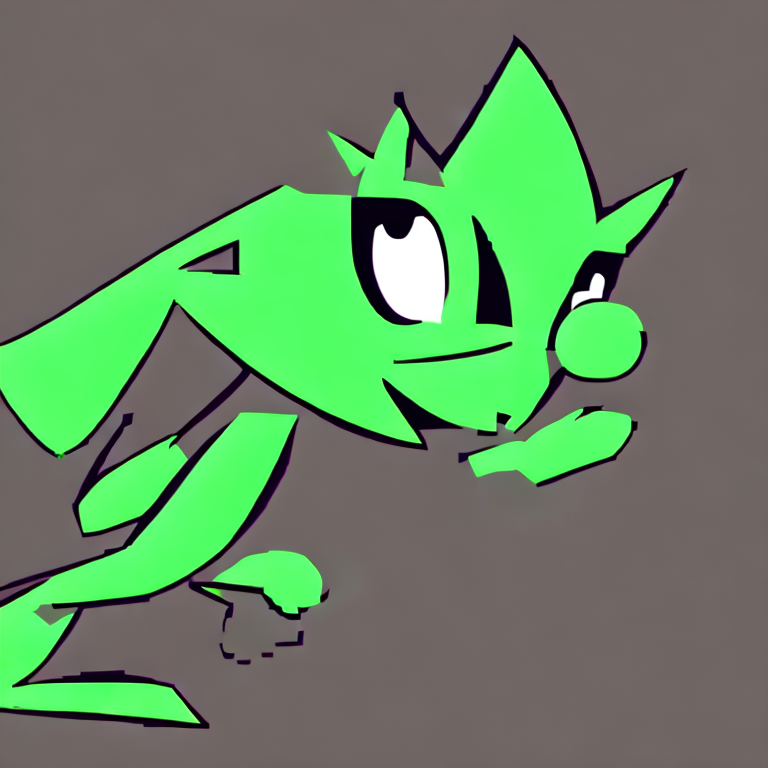

In [ ]:
image

In [ ]:
# Hard coded image dims
device = "cuda"
width = 768#512
height = 768#512

# Generate the latents for the start and end prompt(random noise from gaussian distribution)
seed = 42
generator = torch.Generator(device=device)
latent_noise_start = torch.randn((1, pipe.unet.config.in_channels, height // 8, width // 8),
                      generator=generator.manual_seed(seed),
                      device=device, dtype=torch.float16) 

seed = 43
latent_noise_end = torch.randn((1, pipe.unet.config.in_channels, height // 8, width // 8),
                      generator=generator.manual_seed(seed),
                      device=device, dtype=torch.float16)

In [ ]:
start_prompt = "The sun shining brightly"
end_prompt = "A full moon glowing brightly"

In [ ]:
# Generate images using latents 
start_image = pipe(start_prompt, latents=latent_noise_start)
end_image = pipe(end_prompt, latents=latent_noise_end)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# Convert prompts to CLIP Embeddings for interpolation 
inputs = pipe.tokenizer([start_prompt, end_prompt], padding="max_length", max_length=pipe.tokenizer.model_max_length, truncation=True, return_tensors="pt")

prompt_embeddings = pipe.text_encoder(inputs.input_ids.to('cuda'))[0]

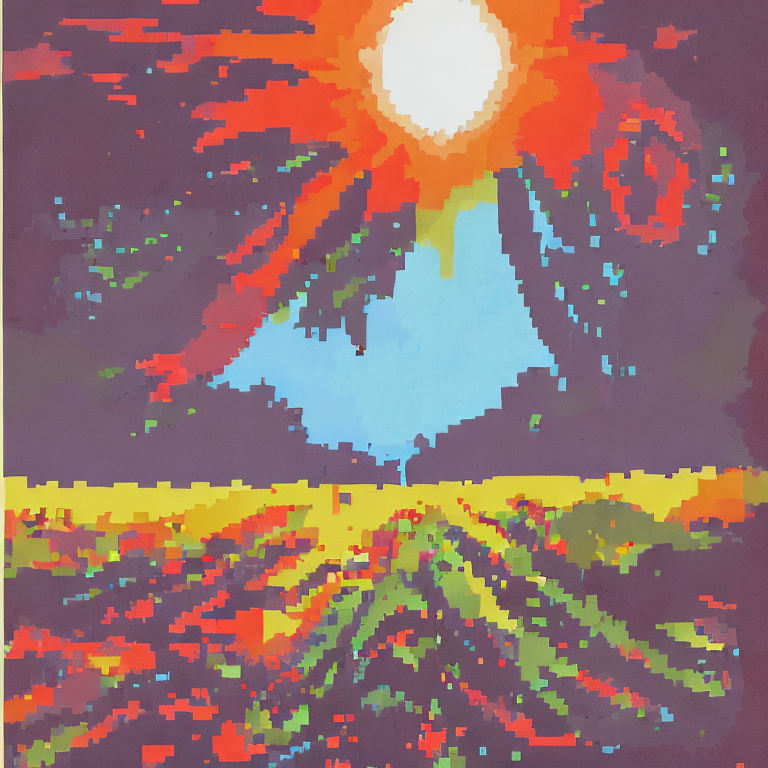

In [ ]:
# Generate starting image
start_image['images'][0]

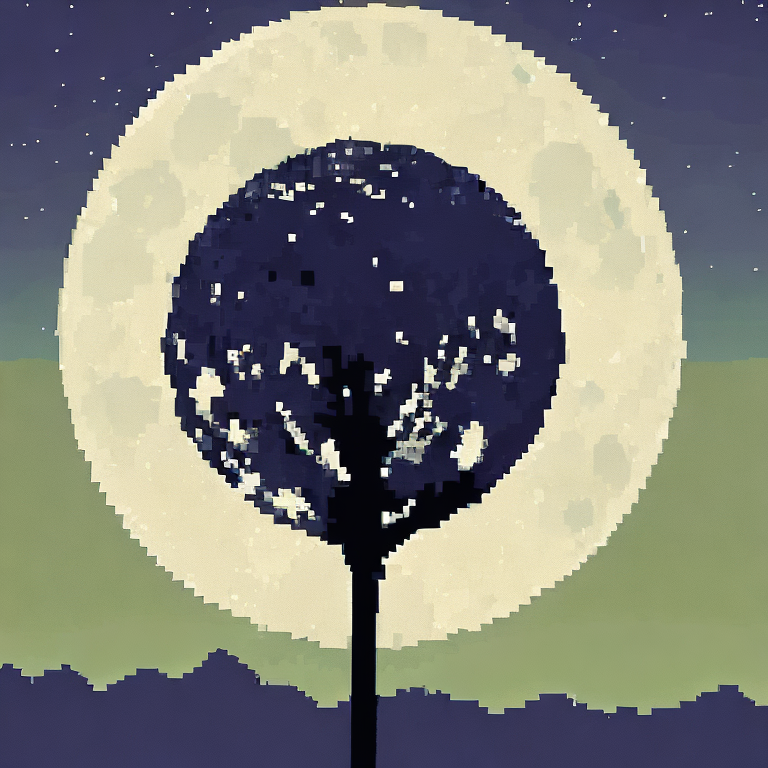

In [ ]:
# Generate ending image
end_image['images'][0]

In [ ]:
# Interpolate the start and end latent noise tensors and prompt embeddings
num_frames = 20
schedule = np.linspace(0, 1, num_frames)
in_between_latents = []
in_between_embeddings = []
prompt_embeddings = prompt_embeddings.cpu().detach().numpy()

for t in schedule:
  in_between_latents.append(slerp(float(t), latent_noise_start, latent_noise_end))
  in_between_embeddings.append(slerp(float(t), prompt_embeddings[0], prompt_embeddings[1]))

In [ ]:
# Generate the interpolated images using the embeddings which will be used as the gif's transition images
in_between_images = []

for i in range(len(in_between_embeddings)):
  in_between_images.append(pipe(latents=in_between_latents[i], prompt_embeds=torch.from_numpy(in_between_embeddings[i][np.newaxis, :, :])))
# in_between_images.append(pipe(latents=in_between_latents[0], prompt_embeds=torch.from_numpy(in_between_embeddings[0][np.newaxis, :, :])))

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

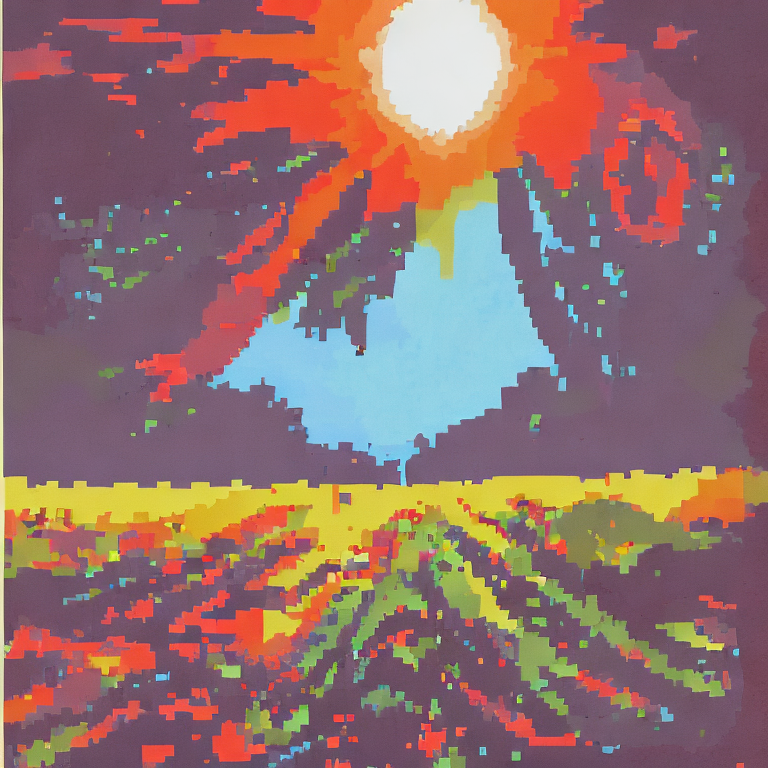

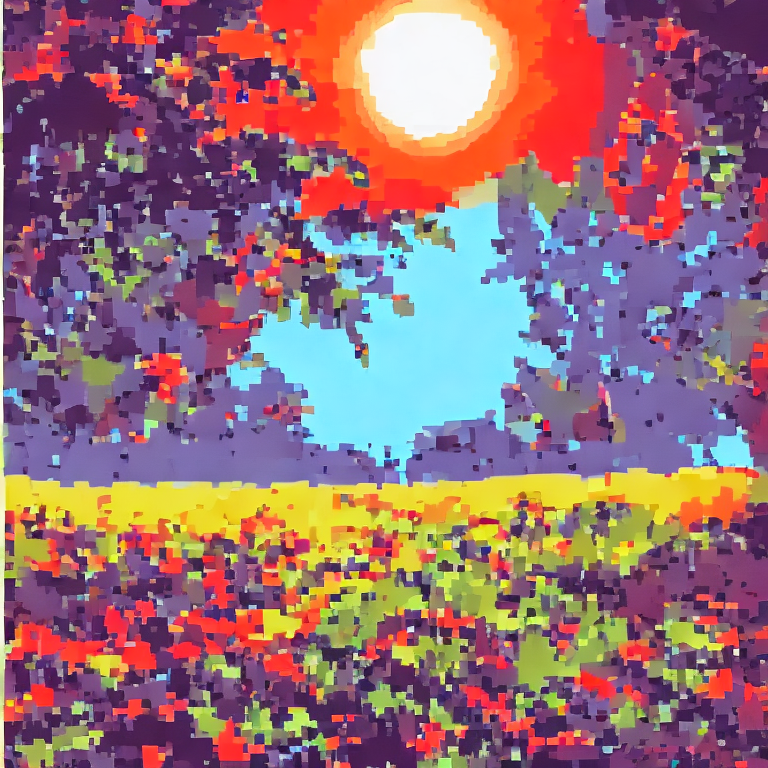

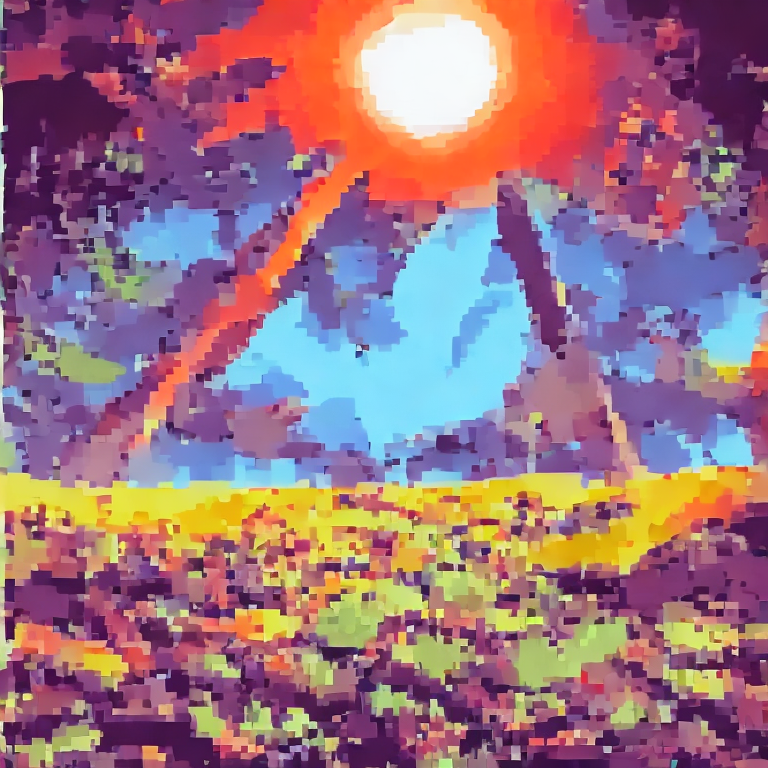

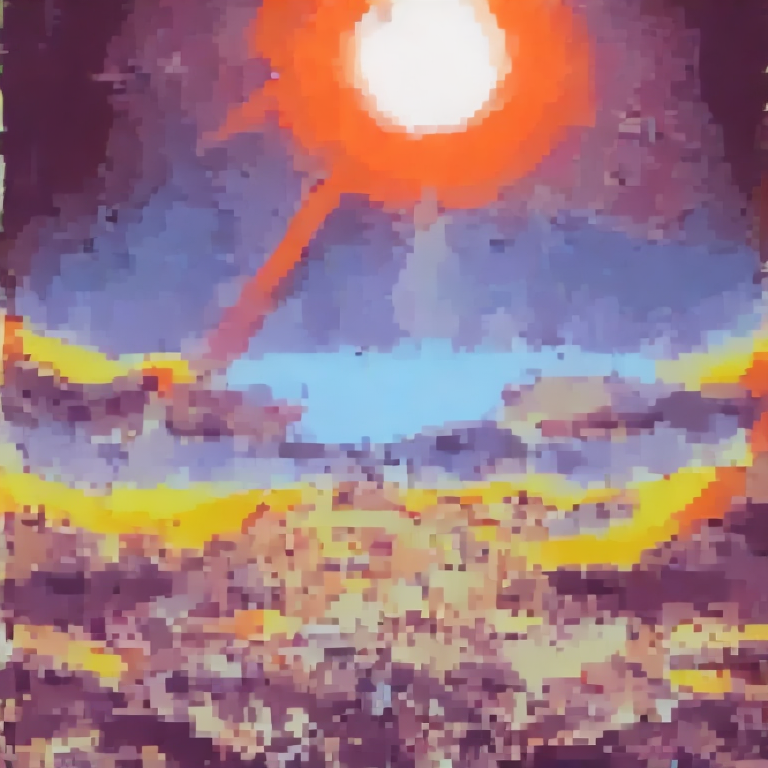

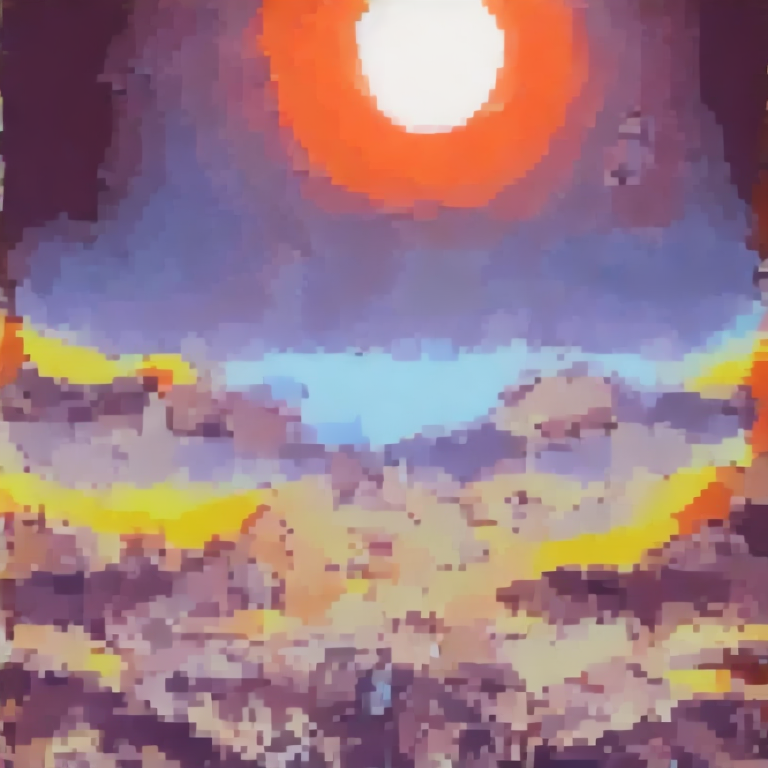

...

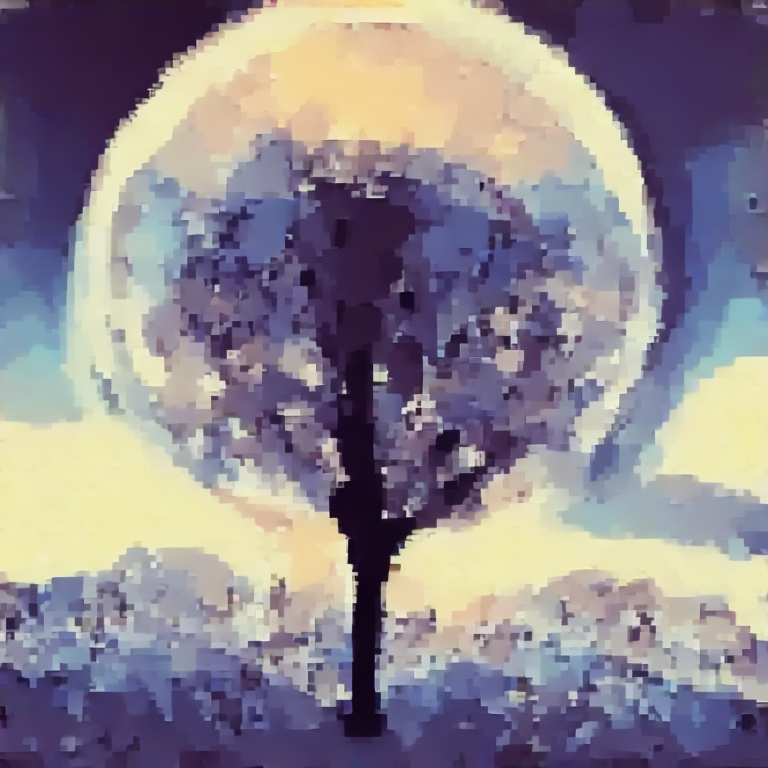

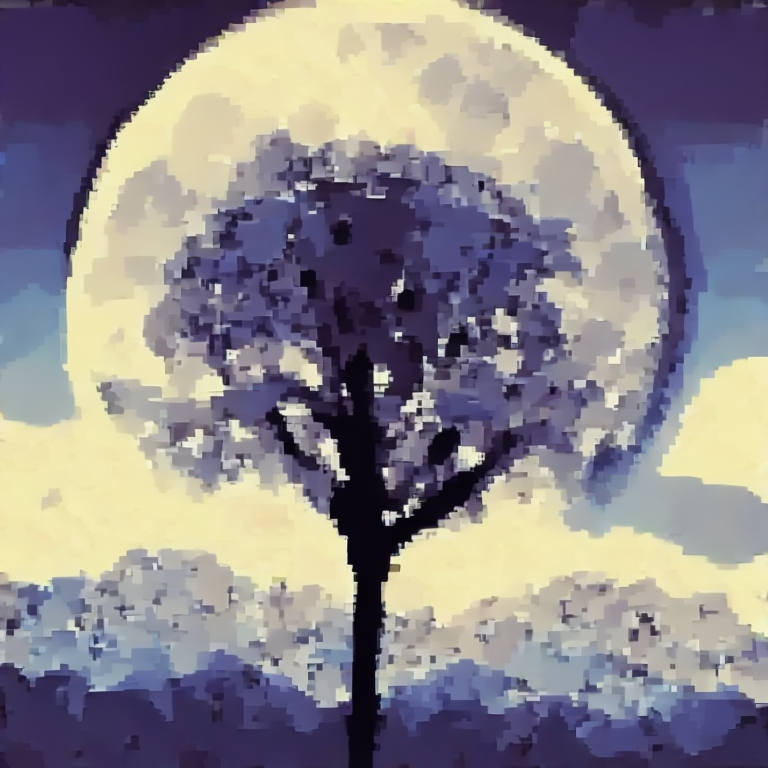

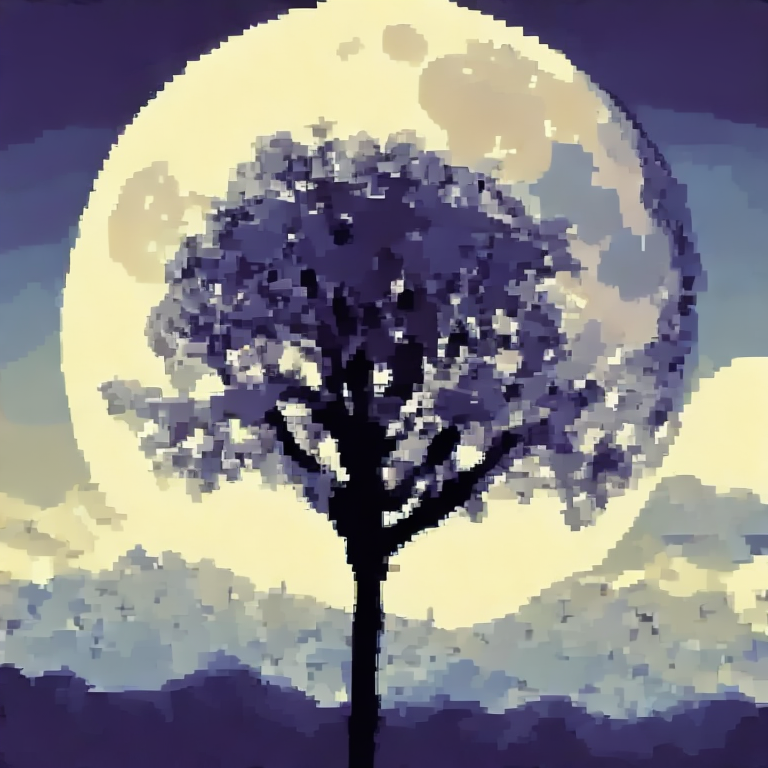

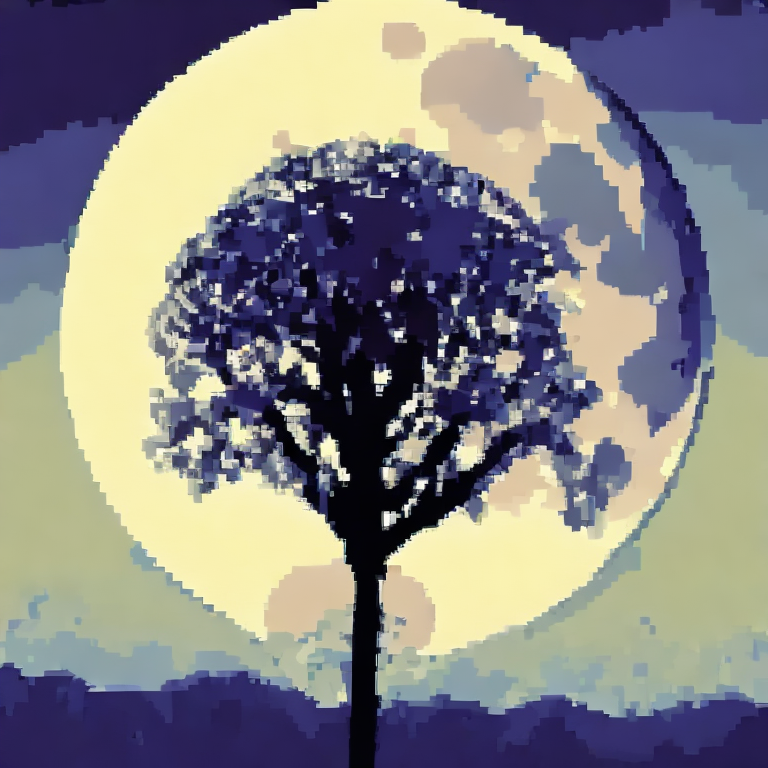

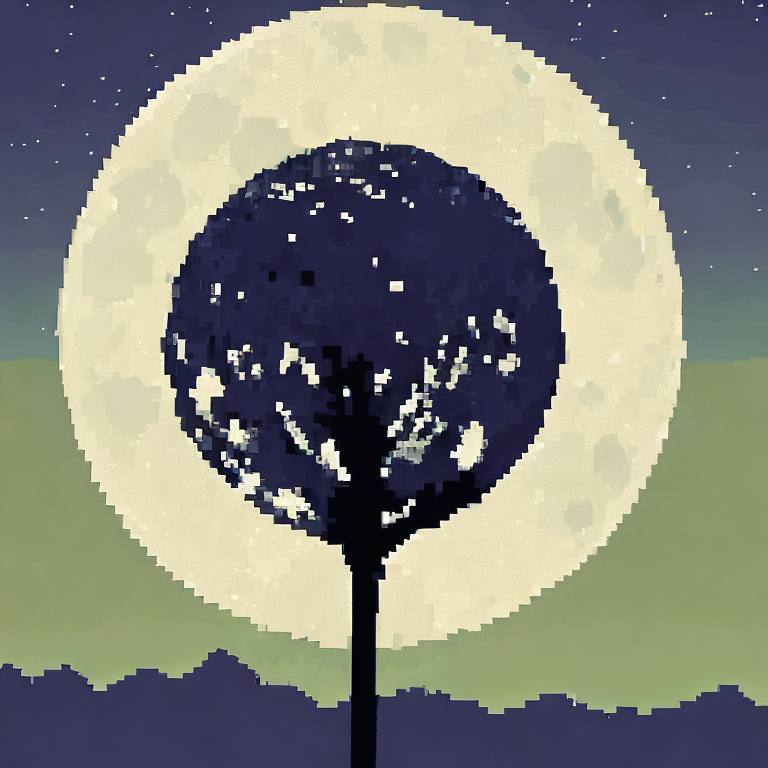

In [ ]:
for i in range(len(in_between_images)):
  in_between_images[i].images[0].show()

In [ ]:
images = [frame['images'][0] for frame in in_between_images]

images[0].save(
    f"test.gif",
    save_all=True,
    append_images=images[1:],
    duration=200,#100,
    loop=0,
)